In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"

using StatsPlots
using StatsBase
using Muon, CSV, DataFrames

theme(:default, grid=false, label="")
gr()

Plots.GRBackend()

In [2]:
ddir = datadir("exp_pro", "BB669")
pdir = plotsdir("specieslevel_metabolite_strainvariation") |> mkpath

"/Users/ben/projects/Doran_etal_2022/plots/specieslevel_metabolite_strainvariation"

In [3]:
biobank = readh5mu(joinpath(ddir, "BB669.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/ben/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 669 ✕ 21485
└ metabolites_foldchange
  AnnData object 669 ✕ 50
└ metabolites_millimolar
  AnnData object 669 ✕ 10
└ UPorder_oggs
  AnnData object 669 ✕ 10177
└ oggs
  AnnData object 669 ✕ 11248

In [17]:
metmtx = biobank["metabolites_foldchange"].X[:, :];
metmtx[isinf.(metmtx)] .= 0.0; # too close to zero for detectable measurment

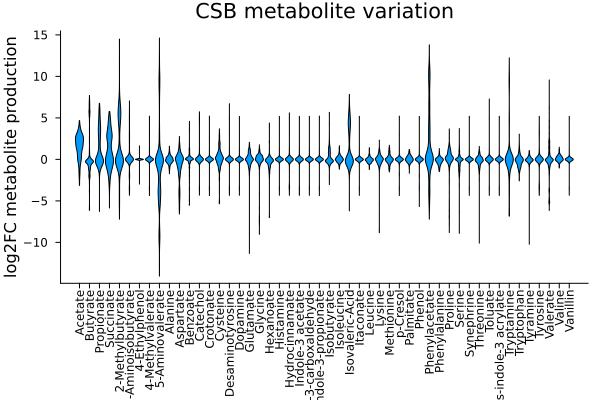

In [18]:
violin(
    metmtx,
    title="CSB metabolite variation",
    ylabel="log2FC metabolite production",
    xticks=(1:size(metmtx, 2), replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>"")),
    xrotation=90,
    c=1,
    tickdirection=:out,
)

In [40]:
keptspecies

66-element Vector{String}:
 "Phocaeicola vulgatus"
 "[Ruminococcus] gnavus"
 "Bacteroides thetaiotaomicron"
 "Anaerostipes hadrus"
 "Bacteroides uniformis"
 "Blautia luti"
 "Bifidobacterium breve"
 "Coprococcus comes"
 "Dorea formicigenerans"
 "Blautia wexlerae"
 ⋮
 "Alistipes putredinis"
 "Roseburia intestinalis"
 "Enterocloster bolteae"
 "[Ruminococcus] torques"
 "Blautia caecimuris"
 "Escherichia fergusonii"
 "Bacteroides dorei"
 "Phocaeicola massiliensis"
 "Mediterraneibacter glycyrrhizinilyticus"

In [41]:
keptspecies = string.(keys(sort(filter(x-> last(x) > 19, countmap(biobank.obs.species)), byvalue=true, rev=true)))
filter!(!=("unclassified"), keptspecies)
full_train_mask = in.(biobank.obs.species, Ref(keptspecies));
full_test_mask = .!(full_train_mask);

In [43]:
metabolite_names_full = biobank["metabolites_foldchange"].var_names.vals;

In [49]:
metmtx = biobank["metabolites_foldchange"].X[:, :];
metmtx[isinf.(metmtx)] .= 0.0; # too close to zero for detectable measurment

measurable_metabolites_mask = mapslices(c->mean(c .==0.) < .9, metmtx[full_train_mask, :], dims=1)|>vec;
keepmetabolites_mask = measurable_metabolites_mask;
metabolite_names = metabolite_names_full[keepmetabolites_mask]

metmtx = metmtx[:, keepmetabolites_mask];
size(metmtx)

(669, 32)

In [46]:
specieslabels = [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
speciescolors = wload(datadir("exp_pro", "BB728", "subsettreecolors.jld2"))["colors"]
speciescolors_ordered = permutedims(speciescolors[replace(indexin(keptspecies, specieslabels), nothing=>9)])

In [55]:
metabolitelabels = replace.(metabolite_names, "_rel"=>"");

In [58]:
ps = []
for (i, species) in enumerate(keptspecies)
    speciesmask = occursin.(species, biobank.obs.species)
    p = violin(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :],
        ylabel=last(split(species," ")),
        c=speciescolors_ordered[i],
        # side=:left,
        xticks= i>=10 ? (1:size(metmtx, 2), metabolitelabels) : (1:size(metmtx, 2), repeat([""], size(metmtx, 2))),
        xrotation=90,
    )
    dotplot!(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :], 
        c=:black, alpha=.2, markerstrokewidth=0, markersize=1,
        # side=:right
    )
    push!(ps, p)
end

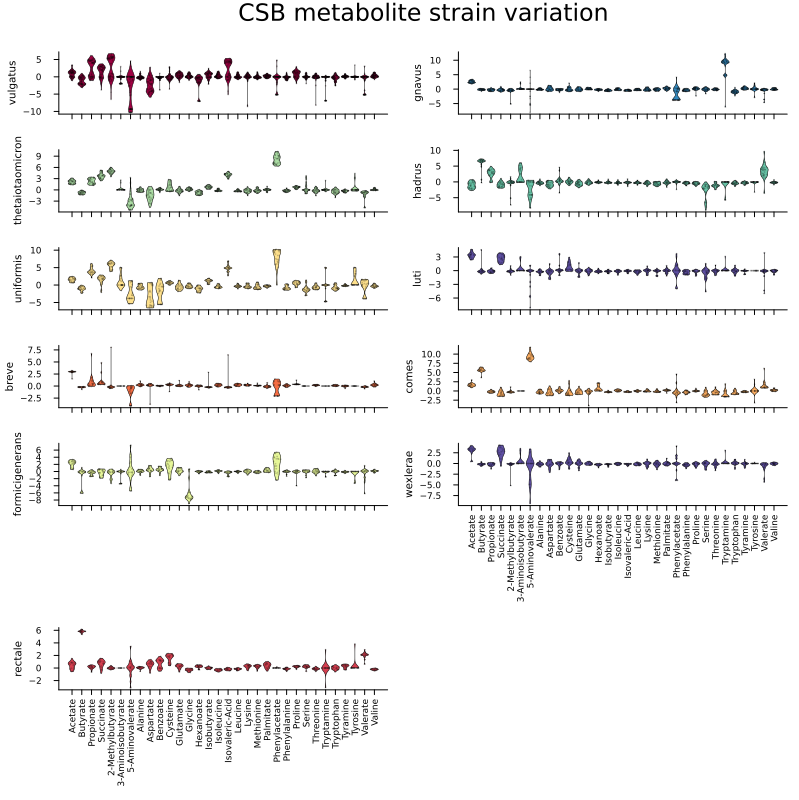

In [76]:
gr()
plot(ps..., 
    layout=grid(ceil(Int, length(keptspecies)/2), 2), 
    plot_title = "CSB metabolite strain variation",
    size=(800, 800),
    tickdirection=:out,
    labelfontsize=7,
    tickfontsize=6,
    lw=.5,
    markersize=1
)

In [78]:
savefig(joinpath(pdir, "violinplots_32metabolites_strainlevel_variation.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/specieslevel_metabolite_strainvariation/violinplots_32metabolites_strainlevel_variation.pdf"

In [79]:
clipboard(metabolitelabels)

In [81]:
sort(countmap(biobank.obs.species[full_train_mask]), byvalue=true)

OrderedCollections.OrderedDict{String, Int64} with 11 entries:
  "[Eubacterium] rectale"        => 20
  "Blautia wexlerae"             => 21
  "Dorea formicigenerans"        => 22
  "Coprococcus comes"            => 23
  "Blautia luti"                 => 24
  "Bifidobacterium breve"        => 24
  "Bacteroides uniformis"        => 27
  "Anaerostipes hadrus"          => 31
  "Bacteroides thetaiotaomicron" => 35
  "[Ruminococcus] gnavus"        => 41
  "Phocaeicola vulgatus"         => 88